# Convolution - Concepts

Convolution - Dot Product operation

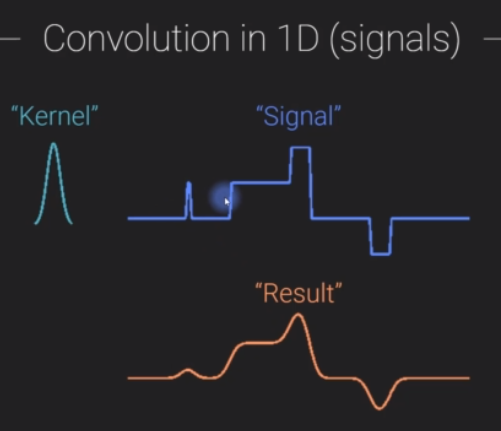

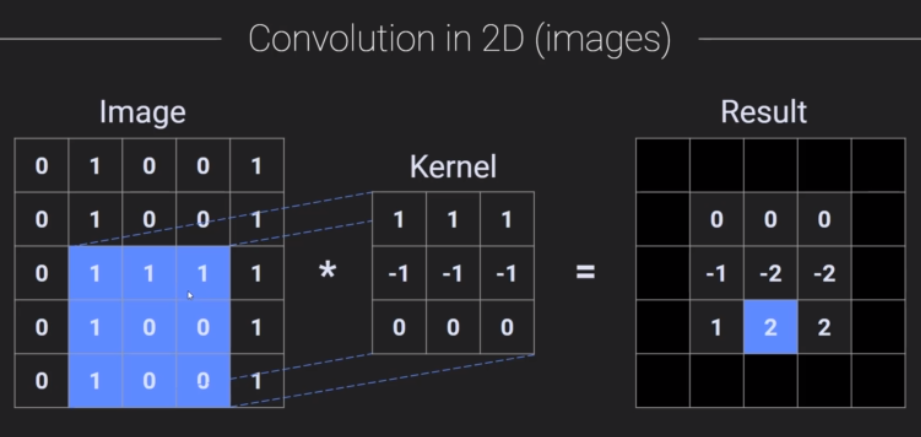

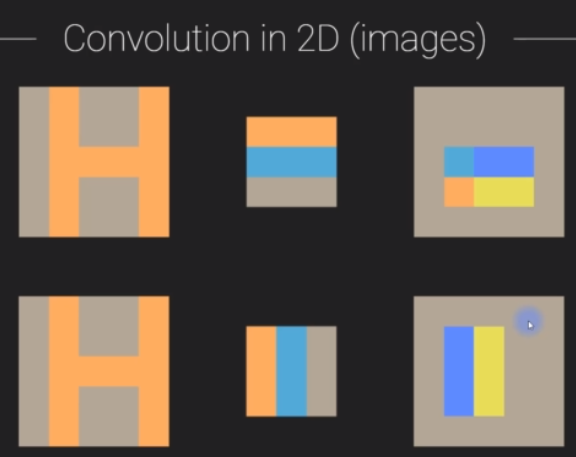

Padding the data (images in this case) helps in capturing all important info or features of data via convolution over padded area as well. It helps in both upsampling and downsampling

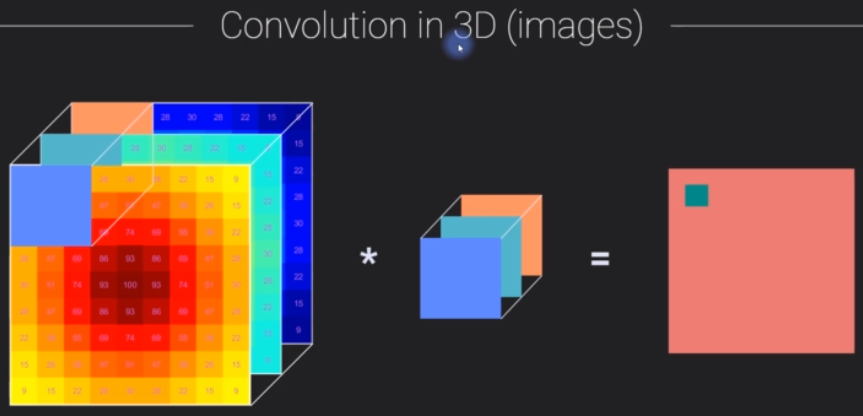

We can have multiple kernels that will produce multiple convolutions of same image

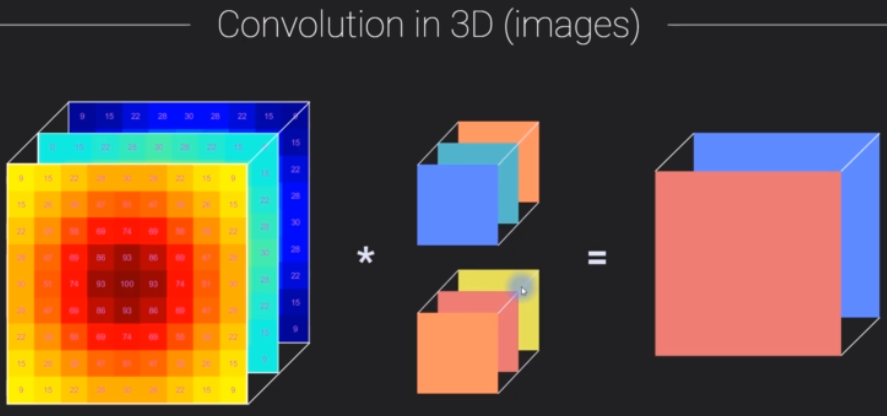

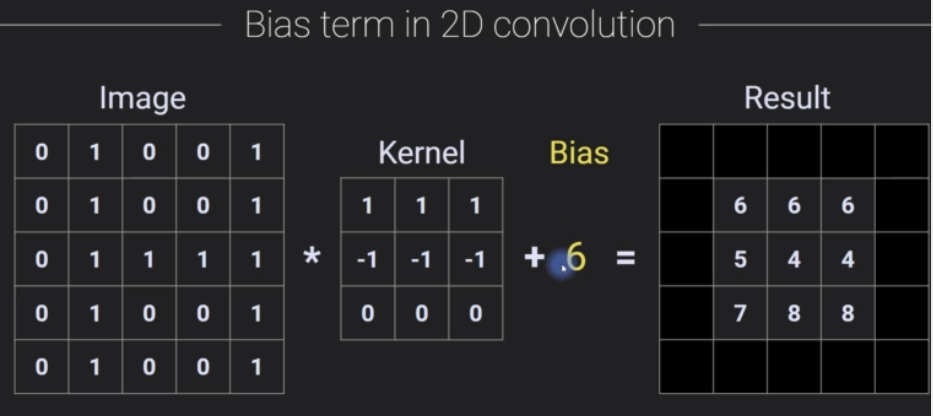

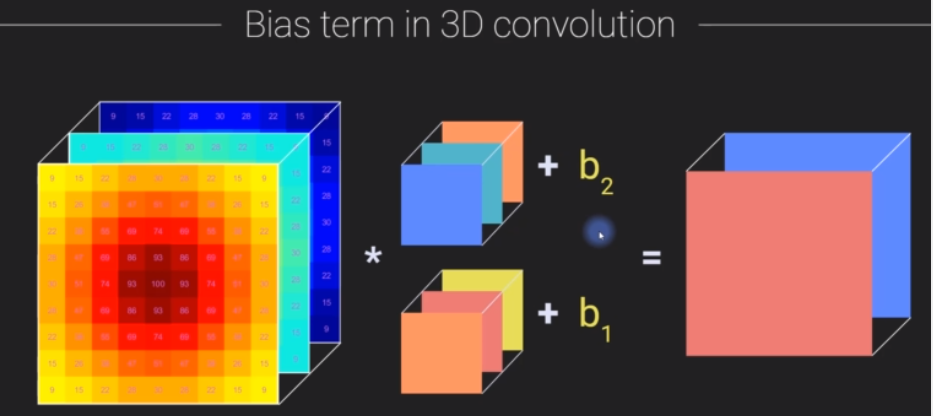

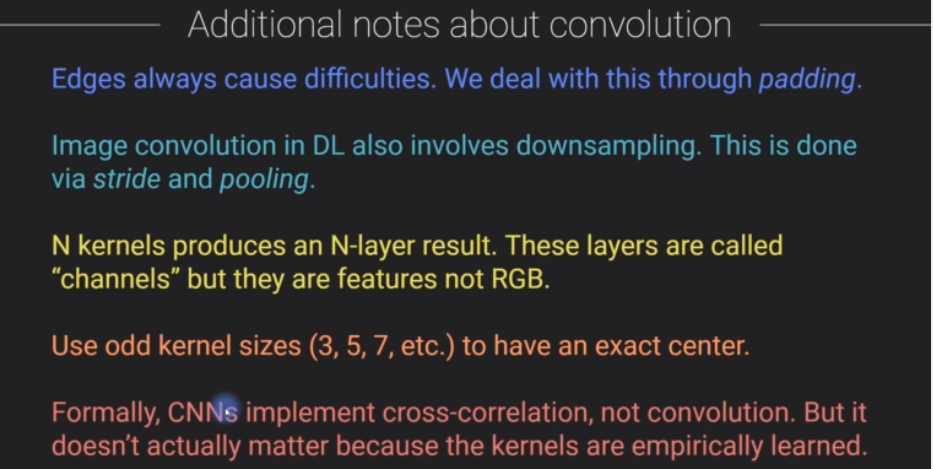

## What is implemented in DL is CROSS CORRELATION, NOT CONVOLUTION. 

## CONVOLUTION INVOLVES FLIPPING OF ROWS AND COLUMNS, i.e. KERNEL IS FLIPPED BACKWARDS BEFORE APPLYING DOT PRODUCT

# Feature maps and convolution kernels

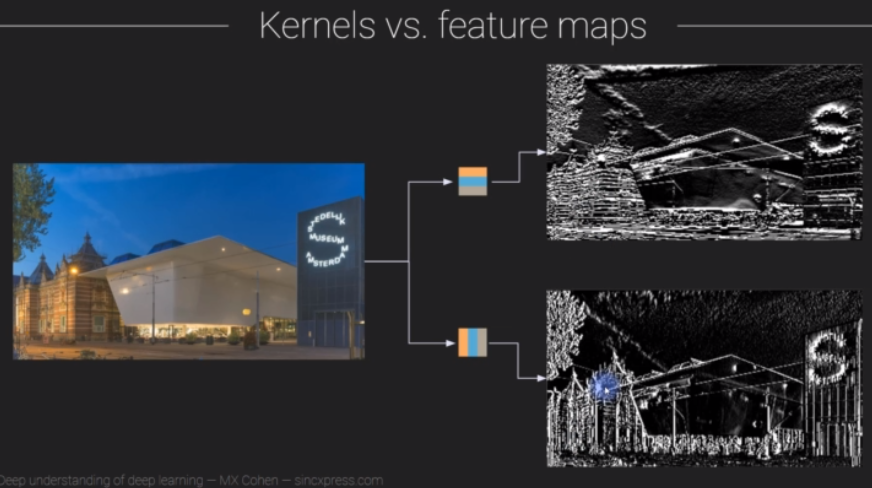

__Convolution kernel <==> image filter__

The results after convolutionof images with kernels are called __feature maps__.

Feature maps formation depend on images mostly than kernels

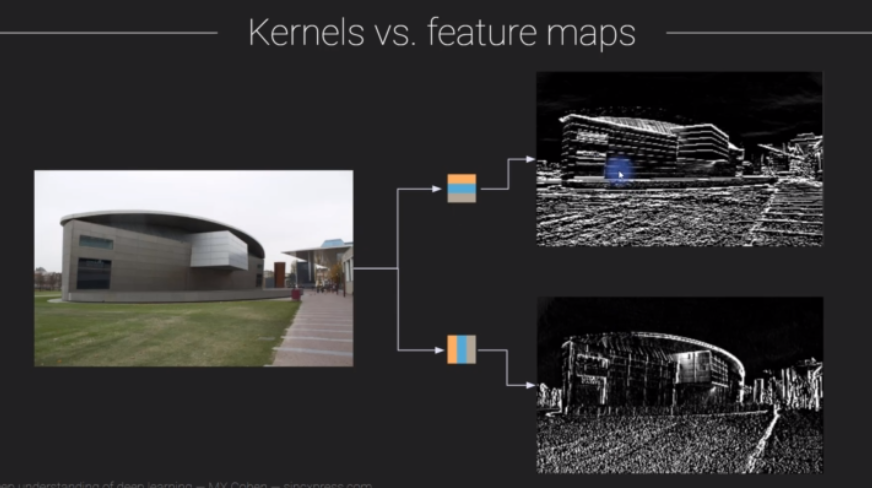

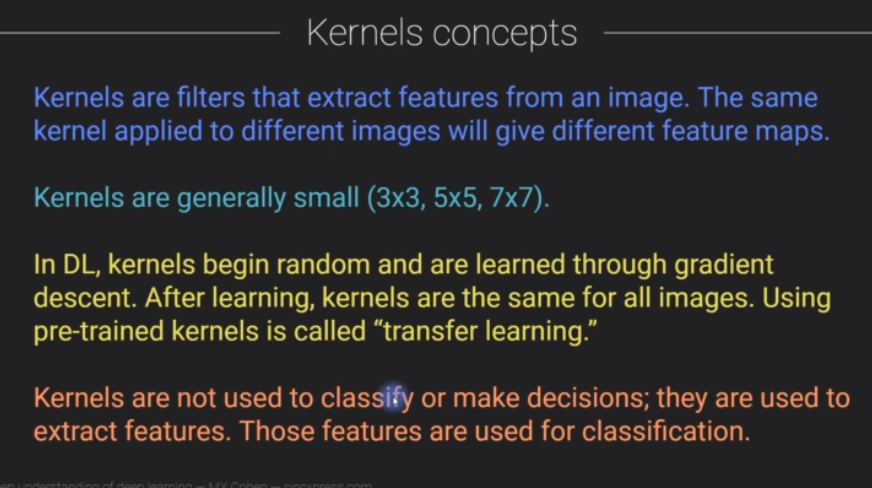

__In DL, any kind of feature map is called a _channel___

Pytorch tensor dim = channels X height X width

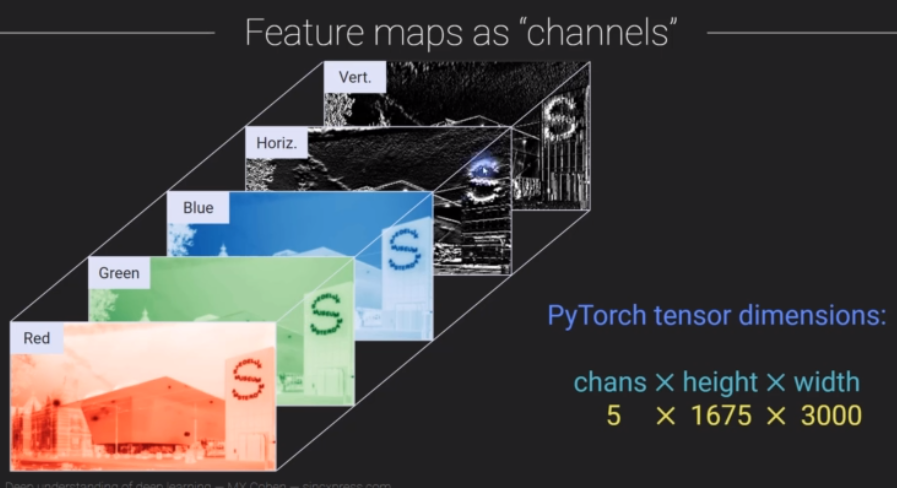

# Convolution in Code

In [1]:
import numpy as np

# convolution
from scipy.signal import convolve2d

# to read img from a url
from imageio import imread

import matplotlib.pyplot as plt
from IPython import display
display.set_matplotlib_formats('svg')

/tmp/ipykernel_7444/3761840034.py:11: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  display.set_matplotlib_formats('svg')


## Manual Convolution

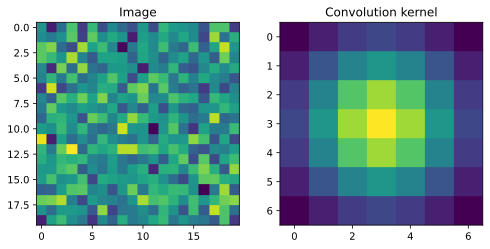

In [10]:
imgN = 20
img = np.random.randn(imgN, imgN)

# convolution kernel
kernelN = 7
Y, X = np.meshgrid(np.linspace(-3,3,kernelN), np.linspace(-3,3,kernelN))
kernel = np.exp( -(X**2 + Y**2)/7) # gaussian kernel

# let's see what they look like
fig,ax = plt.subplots(1,2,figsize=(8,6))
ax[0].imshow(img)
ax[0].set_title('Image')

ax[1].imshow(kernel)
ax[1].set_title('Convolution kernel')

plt.show()

In [11]:
# manual convolution

convOp = np.zeros((imgN, imgN))
halfKr = kernelN//2

for i in range(halfKr, imgN-halfKr): # row indexing
    for j in range(halfKr, imgN-halfKr): # col indexing
        
        # cutting out piece of img
        imgPiece = img[i-halfKr:i+halfKr+1, :] # extract rows first
        imgPiece = imgPiece[:, j-halfKr:j+halfKr+1] # extract columns from remaining img
        
        dp = np.sum(imgPiece*kernel[::-1, ::-1]) # flipping kernel backwards and dot product
        
        convOp[i,j] = dp       

In [12]:
# scipy convolution
convOp2 = convolve2d(img, kernel, mode='valid')

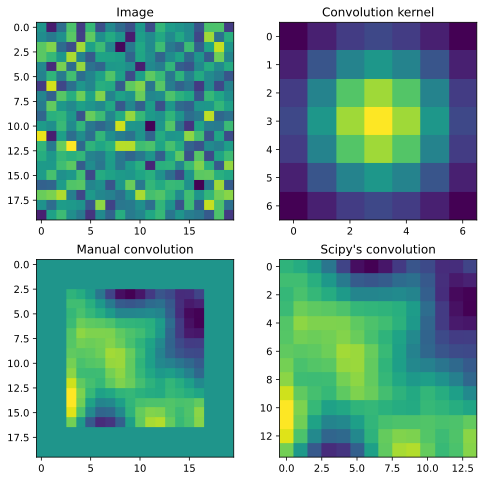

In [13]:
fig,ax = plt.subplots(2,2,figsize=(8,8))

ax[0,0].imshow(img)
ax[0,0].set_title('Image')

ax[0,1].imshow(kernel)
ax[0,1].set_title('Convolution kernel')

ax[1,0].imshow(convOp)
ax[1,0].set_title('Manual convolution')

ax[1,1].imshow(convOp2)
ax[1,1].set_title("Scipy's convolution")

plt.show()

# Examples of convolution with different kernels in a real image

/tmp/ipykernel_7444/431244190.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  bathtub = imread('https://upload.wikimedia.org/wikipedia/commons/6/61/De_nieuwe_vleugel_van_het_Stedelijk_Museum_Amsterdam.jpg')


(1675, 3000, 3)
(1675, 3000)


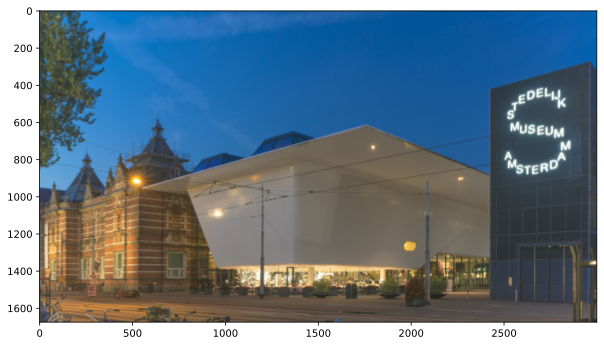

In [14]:
# read a pic from the web
bathtub = imread('https://upload.wikimedia.org/wikipedia/commons/6/61/De_nieuwe_vleugel_van_het_Stedelijk_Museum_Amsterdam.jpg')

# check the size
print(bathtub.shape)

# let's see what the famous Bathtub Museum looks like
fig = plt.figure(figsize=(10,6))
plt.imshow(bathtub);

# transform image to 2D for convenience (not necessary for convolution!)
bathtub = np.mean(bathtub,axis=2)
bathtub = bathtub/np.max(bathtub)

# check the size again
print(bathtub.shape)

In [18]:
# handcrafting two kernels

# vertical kernel
vk = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
])

# horizontal kernel

hk = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1,-1,-1]
])

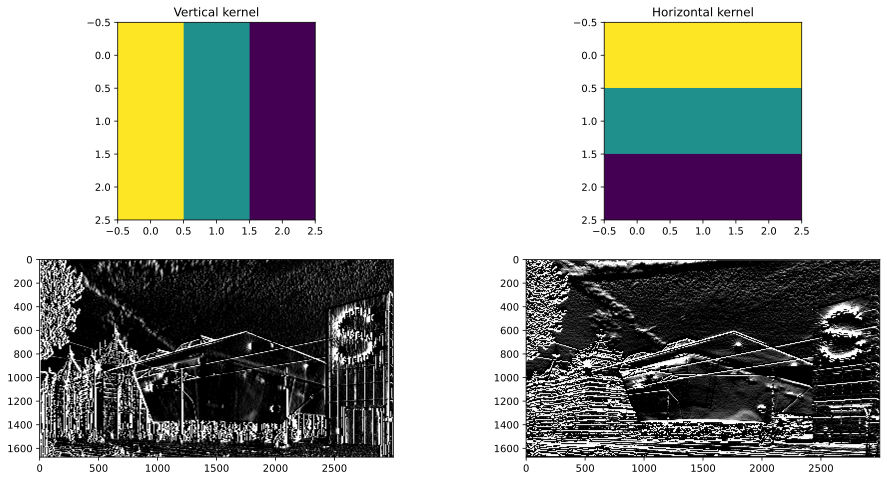

In [19]:
fig,ax = plt.subplots(2,2,figsize=(16,8))

ax[0,0].imshow(vk)
ax[0,0].set_title('Vertical kernel')

ax[0,1].imshow(hk)
ax[0,1].set_title('Horizontal kernel')


# run convolution and show the result
convres = convolve2d(bathtub,vk,mode='same')
ax[1,0].imshow(convres,cmap='gray',vmin=0,vmax=.01)

convres = convolve2d(bathtub,hk,mode='same')
ax[1,1].imshow(convres,cmap='gray',vmin=0,vmax=.01)

plt.show()

### Now in pytorch

In [21]:
import torch
import torch.nn.functional as F

vk_t = torch.tensor(vk).view(1,1,3,3).double() # (no. of img in batch, number of channels, height, width)
hk_t = torch.tensor(hk).view(1,1,3,3).double()
bathtub_t = torch.tensor(bathtub).view(1,1,bathtub.shape[0], bathtub.shape[1])

print(vk_t.shape)
print(bathtub_t.shape)

torch.Size([1, 1, 3, 3])
torch.Size([1, 1, 1675, 3000])


In [22]:
C = F.conv2d(bathtub_t, vk_t)
print(C.shape)

torch.Size([1, 1, 1673, 2998])


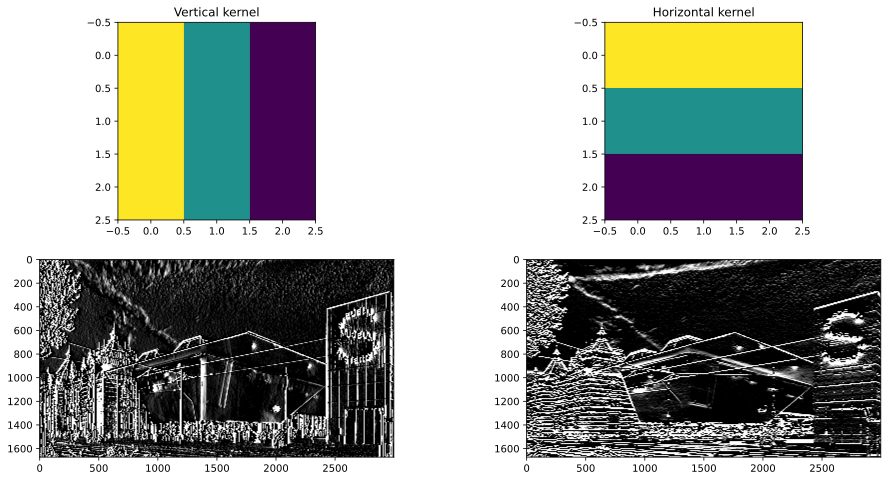

In [24]:
fig,ax = plt.subplots(2,2,figsize=(16,8))

ax[0,0].imshow(vk)
ax[0,0].set_title('Vertical kernel')

ax[0,1].imshow(hk)
ax[0,1].set_title('Horizontal kernel')


# run convolution and show the result
convres = F.conv2d(bathtub_t,vk_t)
img = torch.squeeze(convres.detach()) # sequeezes singleton dimension as plt can't plot 4D data
ax[1,0].imshow(img,cmap='gray',vmin=0,vmax=.01)

convres = F.conv2d(bathtub_t,hk_t)
img = torch.squeeze(convres.detach())
ax[1,1].imshow(img,cmap='gray',vmin=0,vmax=.01)

plt.show()

# Convolution Parameters - Stride and padding

To get convolution result to be the same size as image/original data, we have to do __padding__ - it involves surrounding the original data by adding few number of rows and columns (mostly containing 0s).

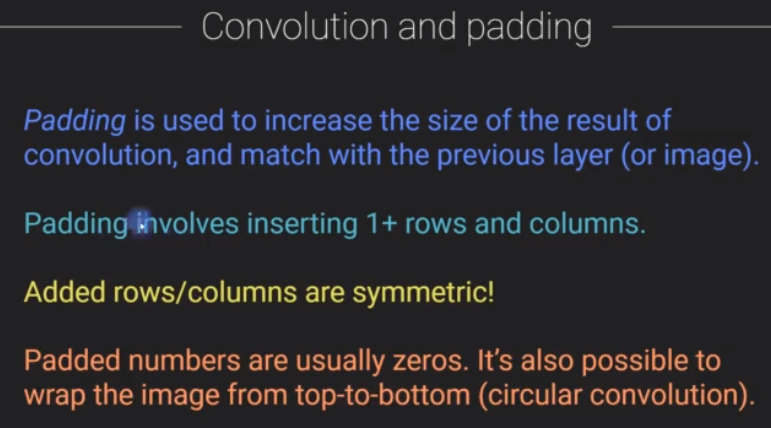

Purpose of __stride__ is to __reduce__ the size of result of convolution. Stride is the number of pixels to skip between convolutions. Stride = 2 implies skip every other pixel and apply convolution

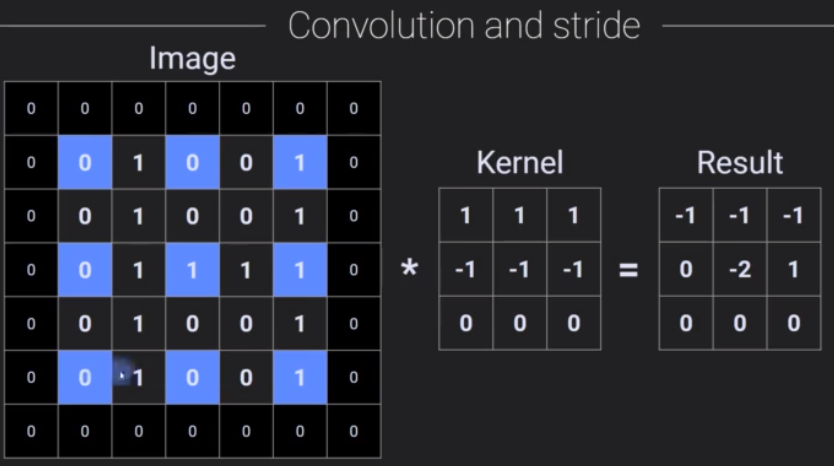

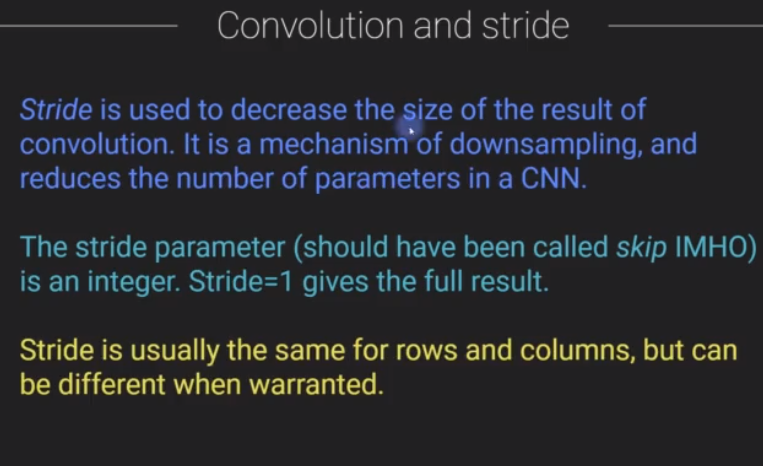

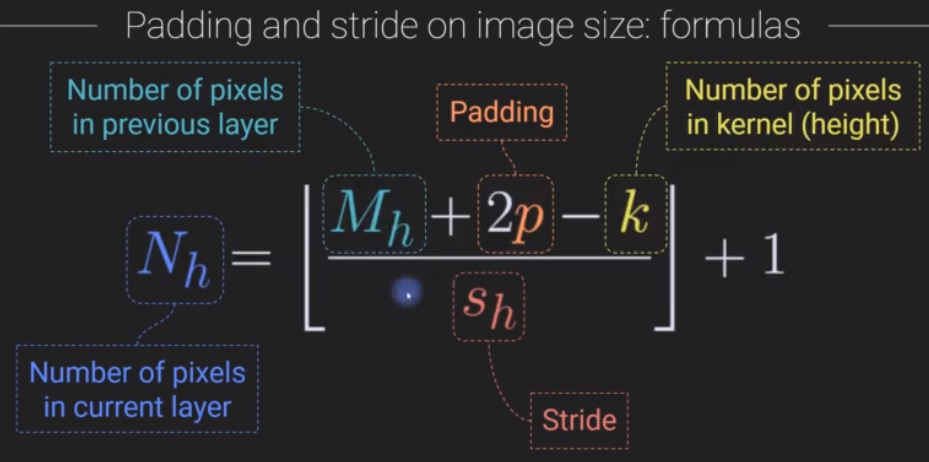

h -> height (w could be used for width)

# Conv2 class in Pytorch

In [25]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

In [26]:
# Creating Conv2D instance with parameters

# params
in_channels = 3 # RGB
out_channels = 15 # 15 feature maps - 15 different kernels
krnl_size = 5 # kernel size - should be odd
stride = 1
padding = 0

# create instance (similar to nn.Linear)
c = nn.Conv2d(in_channels, out_channels, krnl_size, stride, padding)
print(c)

Conv2d(3, 15, kernel_size=(5, 5), stride=(1, 1))


In [28]:
# checking weight tensor
print('Size of weights:', c.weight.shape)
print('Size of bias:', c.bias.shape) # 15 biases for 15 op channels

Size of weights: torch.Size([15, 3, 5, 5])
Size of bias: torch.Size([15])


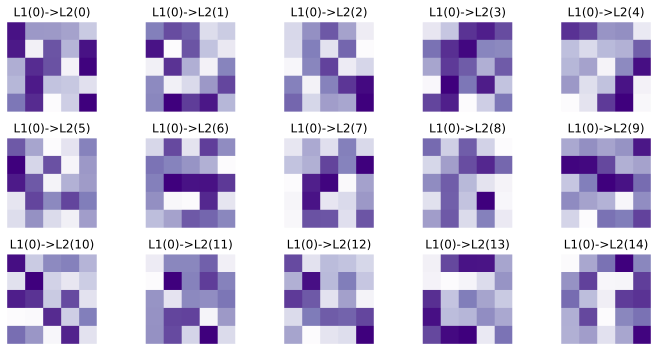

In [29]:
# What do these kernels look like?

fig,axs = plt.subplots(3,5,figsize=(10,5))

for i,ax in enumerate(axs.flatten()):
    ax.imshow(torch.squeeze(c.weight[i,0,:,:]).detach(),cmap='Purples')
    ax.set_title('L1(0)->L2(%s)'%i)
    ax.axis('off')

plt.tight_layout()
plt.show()

torch.Size([1, 3, 64, 64])
(64, 64, 3, 1)


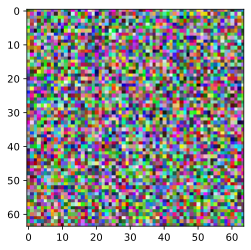

In [30]:
# convolving with an image - (No.of batches, no. of channels, width, height)
imN = (1, 3, 64, 64) 

img = torch.rand(imN)

# channel first for pytorch, but channel last for pyplot
img2view = img.permute(2,3,1,0).numpy()
print(img.shape)
print(img2view.shape)

plt.imshow(np.squeeze(img2view))

In [31]:
# convolve img with filter bank (set of out_channels kernels)

convRes = c(img)

print(img.shape)
print(convRes.shape)

torch.Size([1, 3, 64, 64])
torch.Size([1, 15, 60, 60])


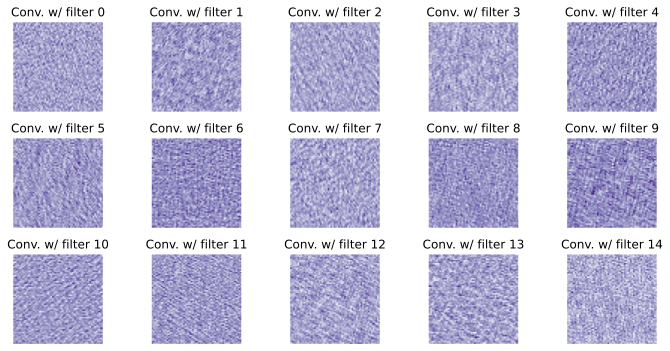

In [32]:
# What do the convolved images look like? (Hint: think of the bathtub picture.)

fig,axs = plt.subplots(3,5,figsize=(10,5))

for i,ax in enumerate(axs.flatten()):

    # extract this "layer" of the convolution result
    I = torch.squeeze(convRes[0,i,:,:]).detach()

    # and visualize it
    ax.imshow(I,cmap='Purples')
    ax.set_title('Conv. w/ filter %s'%i)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Transpose Convolution 

(Not related to transpose operation in any manner)

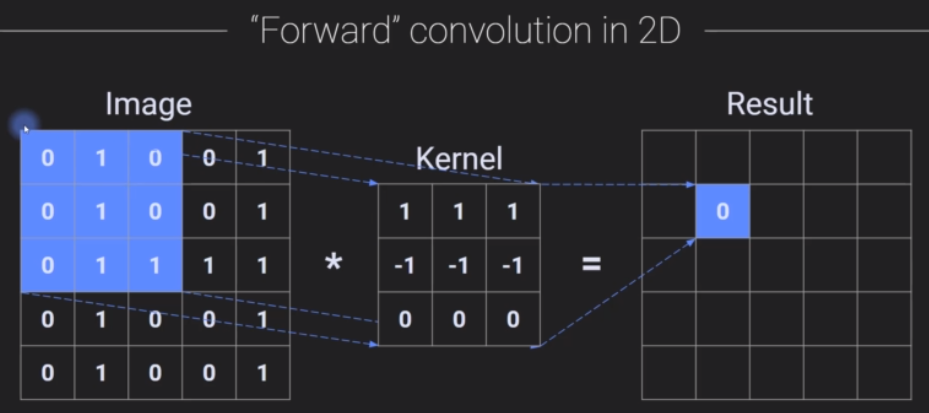

We take a small sized image and apply convolution (backwards) and get a bigger size result. 

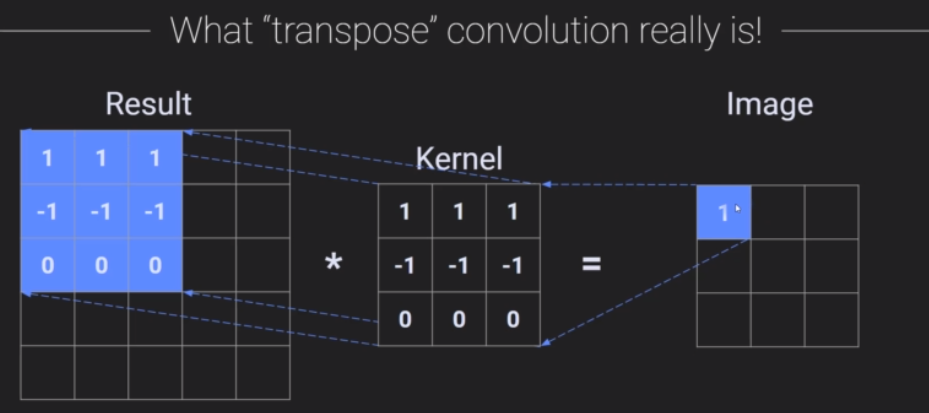

If the result has previous values, then they will be added to computed values to get new values at that point in result

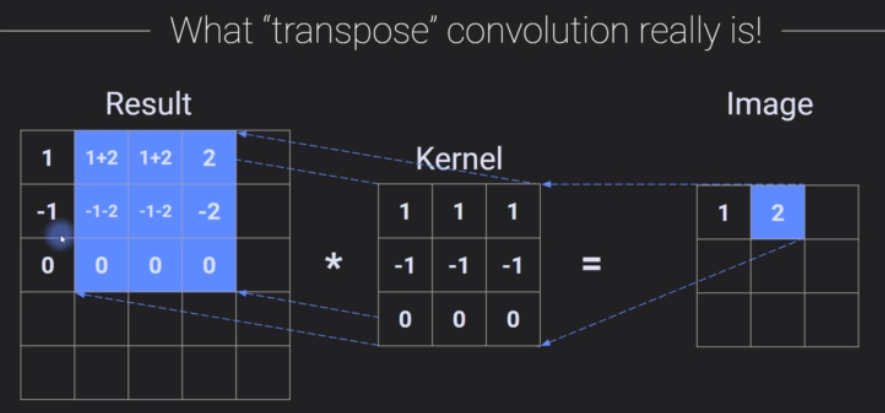

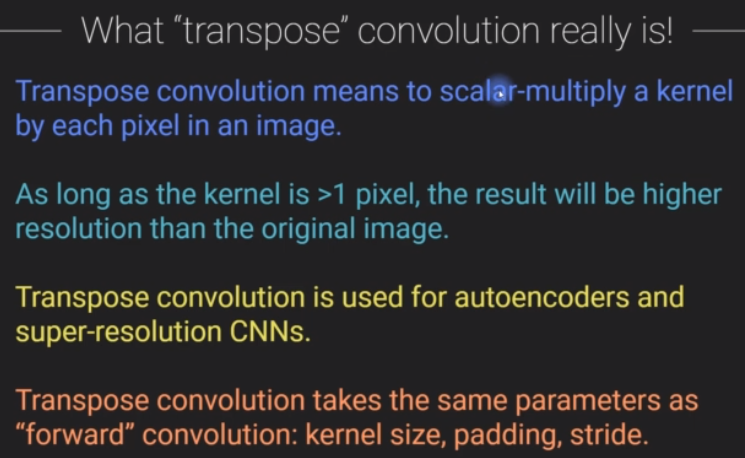

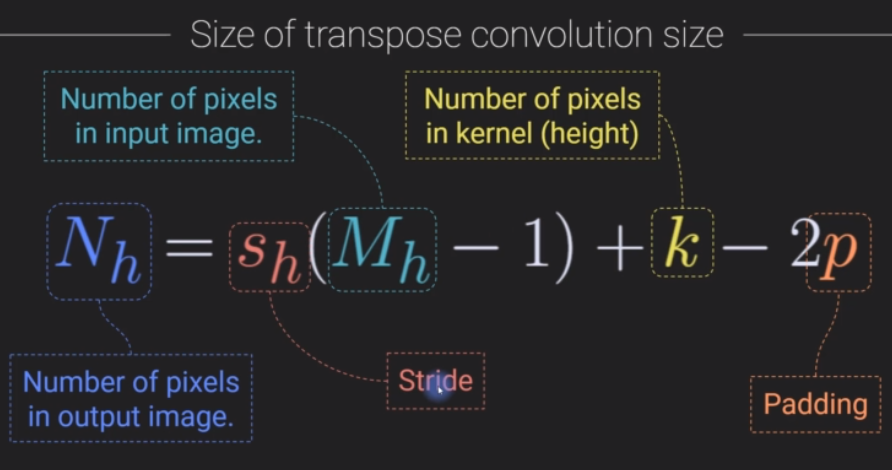

In [34]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

# Creating Transpose convolution instance with parameters

# params
in_channels = 3 # RGB
out_channels = 15 # 15 feature maps - 15 different kernels
krnl_size = 5 # kernel size - should be odd
stride = 1
padding = 0

# create instance (similar to nn.Linear)
c = nn.ConvTranspose2d(in_channels, out_channels, krnl_size, stride, padding)
print(c)

# checking weight tensor
print('Size of weights:', c.weight.shape)
print('Size of bias:', c.bias.shape) # 15 biases for 15 op channels

ConvTranspose2d(3, 15, kernel_size=(5, 5), stride=(1, 1))
Size of weights: torch.Size([3, 15, 5, 5])
Size of bias: torch.Size([15])


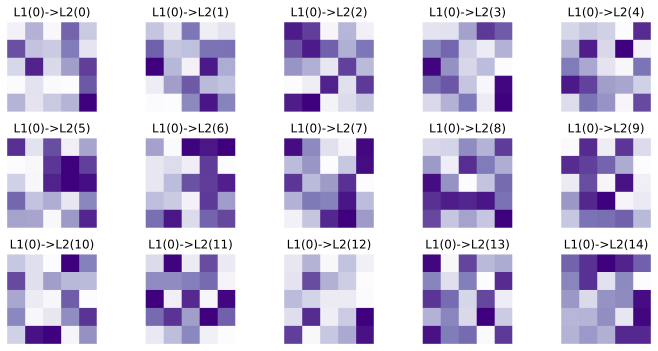

In [36]:
# What do these kernels look like?

fig,axs = plt.subplots(3,5,figsize=(10,5))

for i,ax in enumerate(axs.flatten()):
    ax.imshow(torch.squeeze(c.weight[0,i,:,:]).detach(),cmap='Purples')
    ax.set_title('L1(0)->L2(%s)'%i)
    ax.axis('off')

plt.tight_layout()
plt.show()

torch.Size([1, 3, 64, 64])
(64, 64, 3, 1)


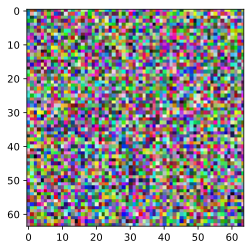

In [37]:
# convolving with an image - (No.of batches, no. of channels, width, height)
imN = (1, 3, 64, 64) 

img = torch.rand(imN)

# channel first for pytorch, but channel last for pyplot
img2view = img.permute(2,3,1,0).numpy()
print(img.shape)
print(img2view.shape)

plt.imshow(np.squeeze(img2view))

In [38]:
# convolve img with filter bank (set of out_channels kernels)

convRes = c(img)

print(img.shape)
print(convRes.shape)

torch.Size([1, 3, 64, 64])
torch.Size([1, 15, 68, 68])


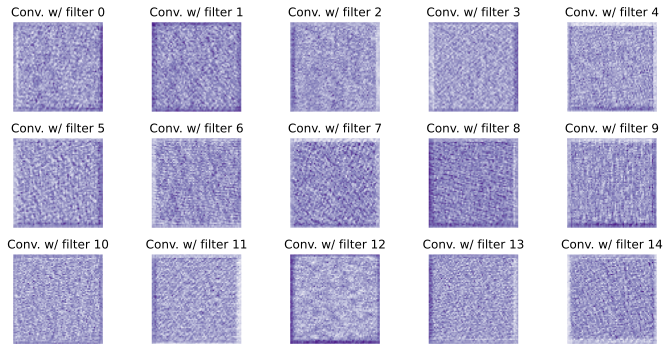

In [40]:
fig,axs = plt.subplots(3,5,figsize=(10,5))

for i,ax in enumerate(axs.flatten()):

    # extract this "layer" of the convolution result
    I = torch.squeeze(convRes[0,i,:,:]).detach()

    # and visualize it
    ax.imshow(I,cmap='Purples')
    ax.set_title('Conv. w/ filter %s'%i)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Pooling - Max/Mean

Pooling is applied after convolution. Also downsamples the result.

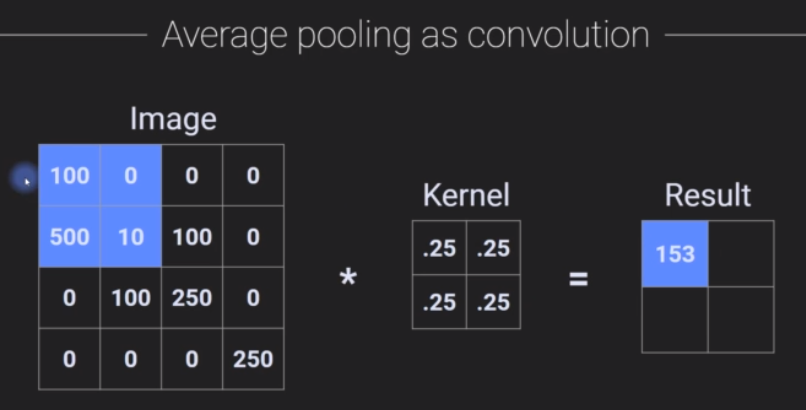

Max pooling just takes in the max element within the defined window

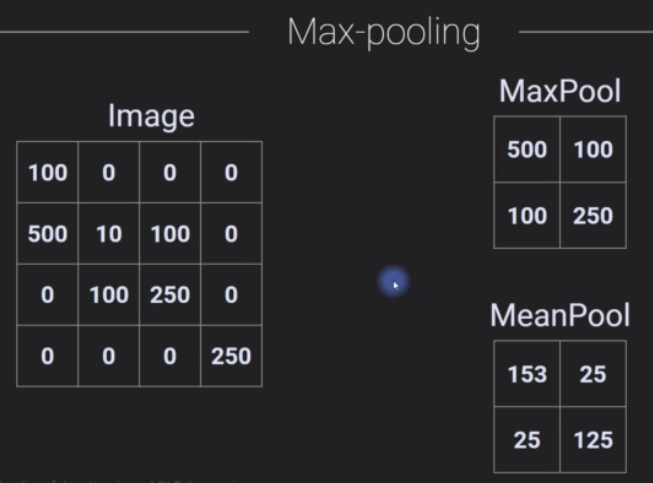

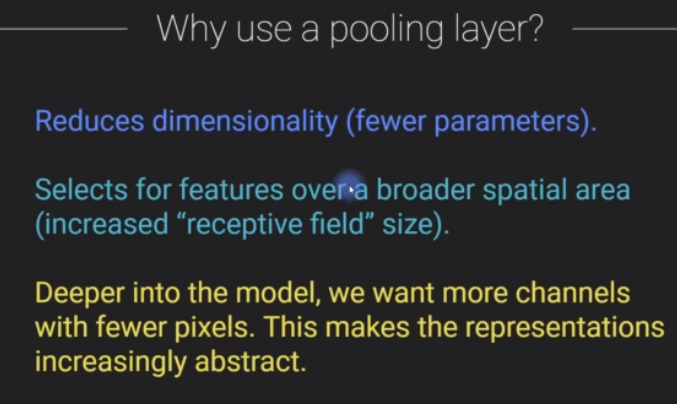

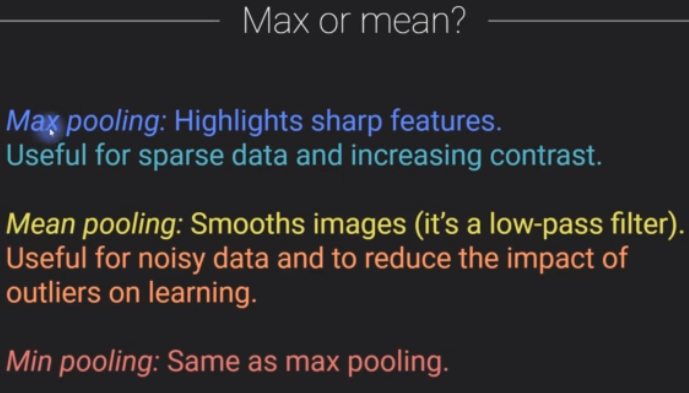

Minpooling - almost same as max pooling, but takes min value

__Receptive Fields__ - in DL, this is the __number of pixels in an image that are mapped onto a single unit in a layer of network__.

Having one-one mapping of pixel to units (like ANN) makes model non-robust to translation, rotation, resizing etc.

By Pooling, we are mapping larger area of image (or segment of data) to a smaller area in pooling result. This enables for smaller area have a grasp of anything that is happening __anywhere__ in the larger area.

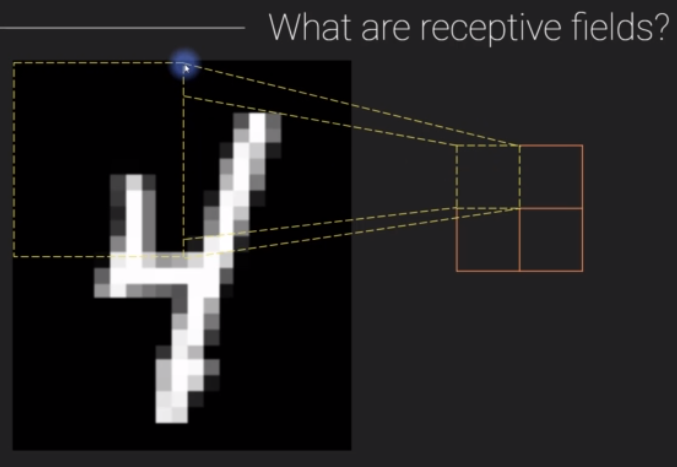

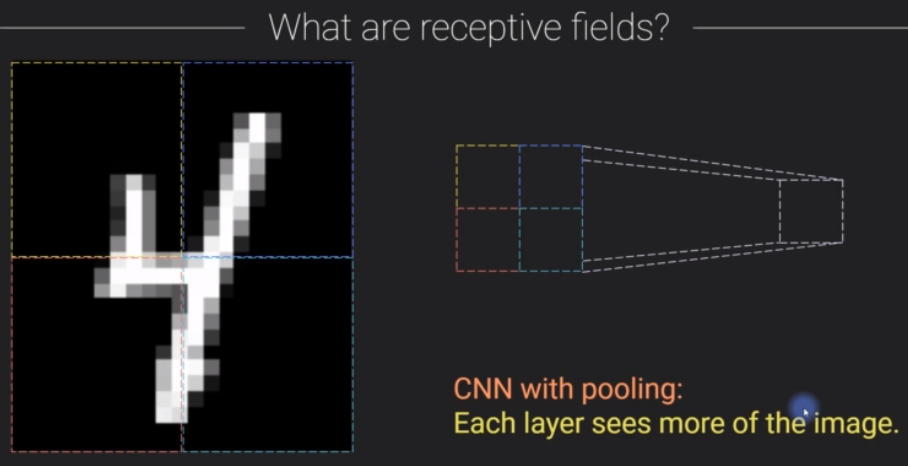

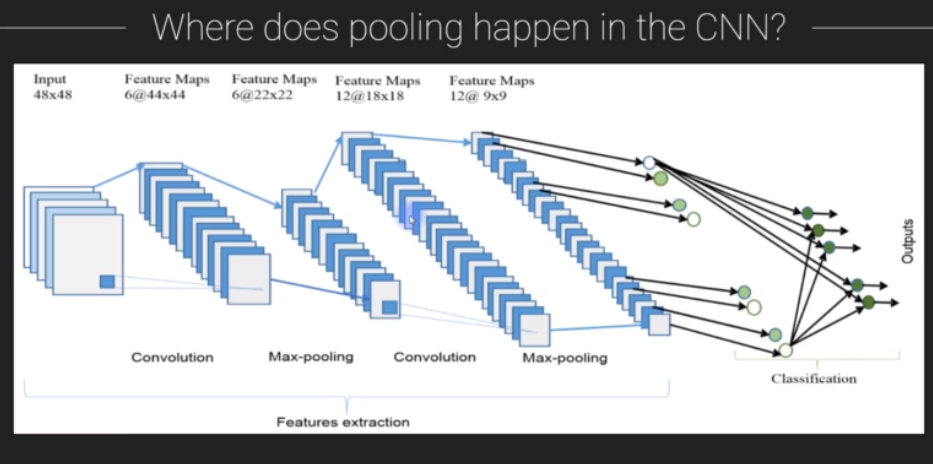

For 3D image, we could do 2D pooling where we condense 2d channels of each dimension into a smaller 3D image, or 3D pooling where we condense a 3D cube into a smaller 2D image

# Pooling in Pytorch

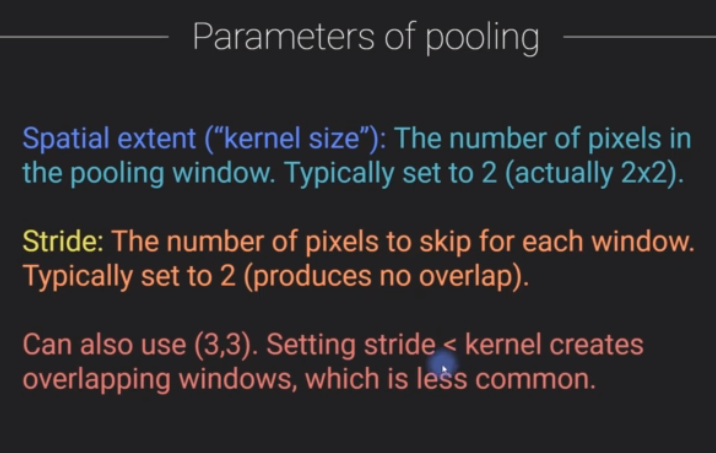

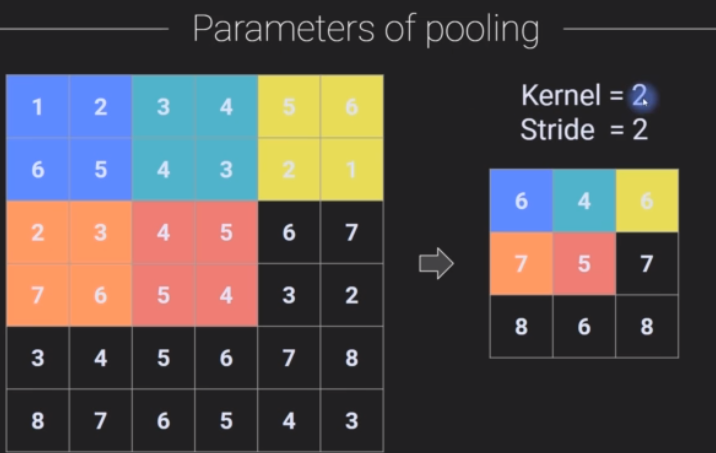

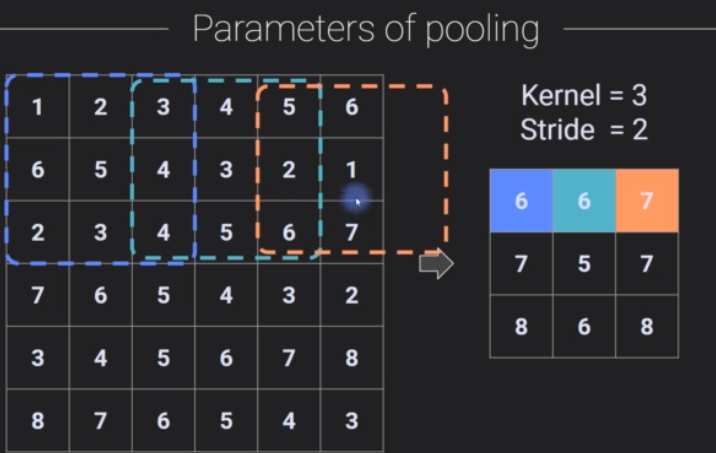

Two ways to deal with edges is to consider remaining elements in window for pooling, or drop the window altogether

In [41]:
import torch
import torch.nn as nn

In [44]:
# creating pool instance with params

# params
pool_size = 3
stride = 3

# creating instance
p2 = nn.MaxPool2d(pool_size, stride)
p3 = nn.MaxPool3d(pool_size, stride)

print(p2)
print(p3) # ceil_mode=False(default) for avoiding edges, True for including edges

MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
MaxPool3d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)


In [47]:
# creating img and applying maxpool

# creating 2D and 3D img
img2 = torch.randn(1,1,30,30)
img3 = torch.randn(1,3,30,30)

img2pool2 = p2(img2)
print('2D img, 2D max pooling:', img2pool2.shape)

# img2pool3 = p3(img2) # error - applying 3d pooling to 2d operation
# print('2D img, 3D max pooling:', img2pool3.shape)

img3pool2 = p2(img3)
print('3D img, 2D max pooling:', img3pool2.shape)

img3pool3 = p3(img3)
print('3D img, 3D max pooling:', img3pool3.shape)

2D img, 2D max pooling: torch.Size([1, 1, 10, 10])
3D img, 2D max pooling: torch.Size([1, 3, 10, 10])
3D img, 3D max pooling: torch.Size([1, 1, 10, 10])


### Creating simple CNN

In [49]:
littleNet = nn.Sequential(
    # conv pool block
    nn.Conv2d(3,10,5,3,2), # conv layer
    nn.ReLU(),   # activation function
    nn.AvgPool3d(3,3),  # avg pooling
    
    # FFN block
    nn.Flatten(),   # vectorizing the image to linear form
    nn.Linear(588, 1),
    nn.Sigmoid(),  # op activation
)

In [50]:
# testing with data

img = torch.rand(1, 3, 128, 128)
littleNet(img)

tensor([[0.5087]], grad_fn=<SigmoidBackward0>)

# Pool vs Stride

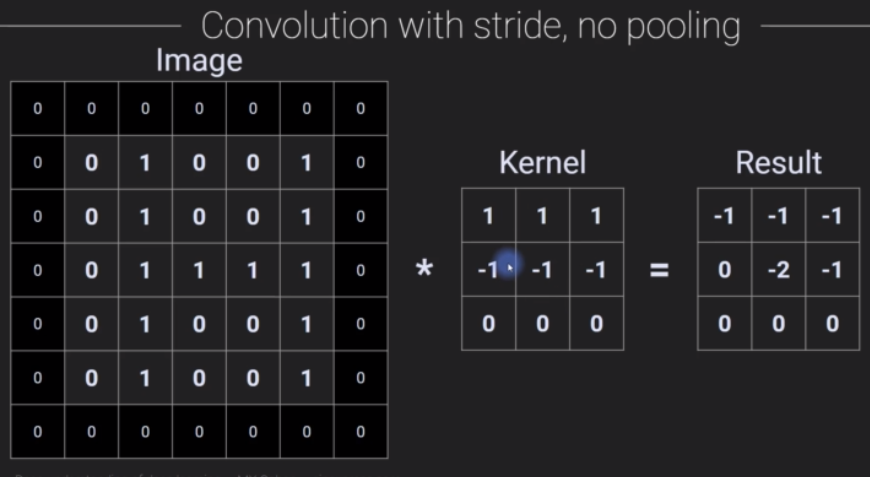

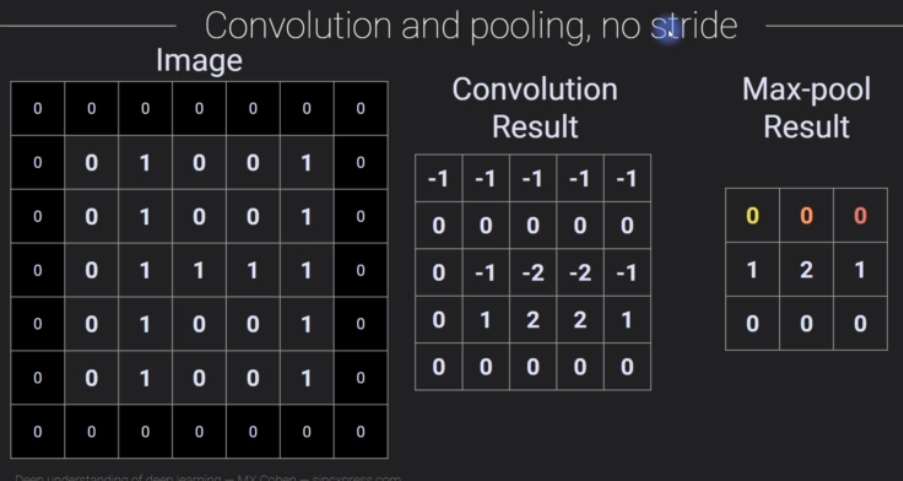

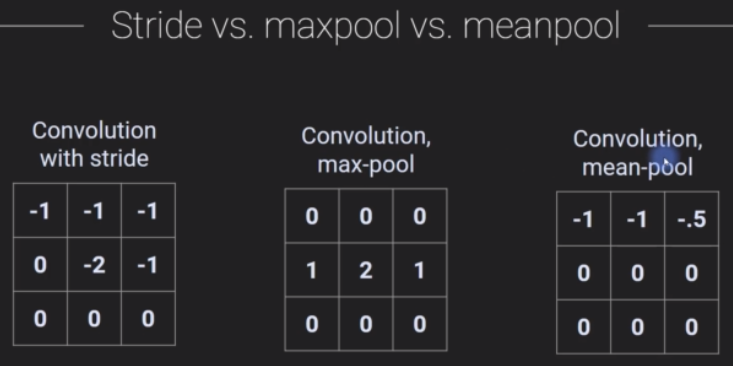

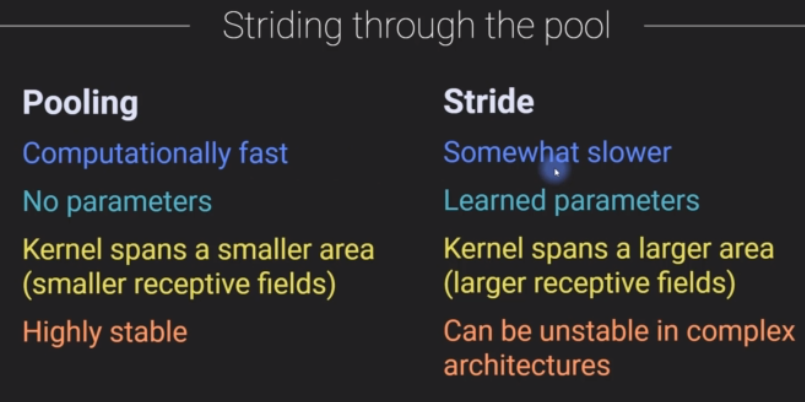

# Image transforms

Two reasons to transform images:
- Pretrained CNNs are coded for certain image sizes and/or properties. Hence transformation could be required
- It is a way to increase dataset size (data augmentation)

In [64]:
import numpy as np
import torch

import torchvision
import torchvision.transforms as T

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
from IPython import display
display.set_matplotlib_formats('svg')

In [53]:
# Loading CIFAR dataset from torchvision

cdata = torchvision.datasets.CIFAR10(root='cifar10', download=True)

print(cdata)

100%|████████████████████████| 170498071/170498071 [01:16<00:00, 2214580.17it/s]


Extracting cifar10/cifar-10-python.tar.gz to cifar10
Dataset CIFAR10
    Number of datapoints: 50000
    Root location: cifar10
    Split: Train


In [56]:
print(cdata.data.shape)
print(cdata.classes)
print(len(cdata.targets))

(50000, 32, 32, 3)
['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
50000


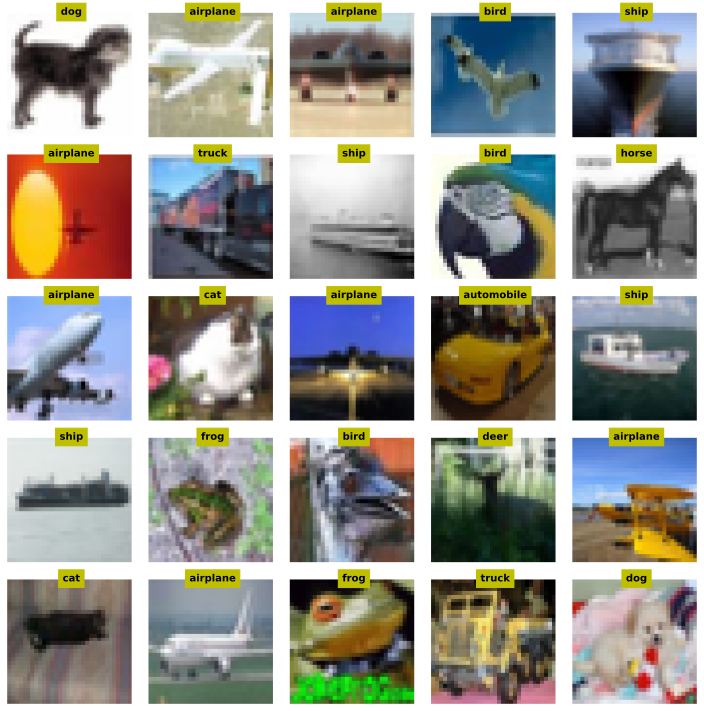

In [57]:
# inspect a few random images

fig,axs = plt.subplots(5,5,figsize=(10,10))

for ax in axs.flatten():

    # select a random picture
    randidx = np.random.choice(len(cdata.targets))

    # extract that image
    pic = cdata.data[randidx,:,:,:]
    # and its label
    label = cdata.classes[cdata.targets[randidx]]

    # and show!
    ax.imshow(pic)
    ax.text(16,0,label,ha='center',fontweight='bold',color='k',backgroundcolor='y')
    ax.axis('off')

plt.tight_layout()
plt.show()

## Applying transformations

In [66]:
Ts = T.Compose([    # it groups multiple transformations together to apply on data
    T.ToTensor(), # converts img to tensor and also applies normalization
    T.Resize(32*4), # increasing img resolution by factor of 4
    T.Grayscale(num_output_channels=1)  # converts color to gray scale
])

# Including transformations in dataset, NOT TRASNFORMING YET
cdata.transform = Ts

# you can also apply the transforms immediately when loading in the data
# cdata = torchvision.datasets.CIFAR10(root='cifar10', download=True, transform=Ts)

print(cdata.data[123,:,:,:].shape)

(32, 32, 3)


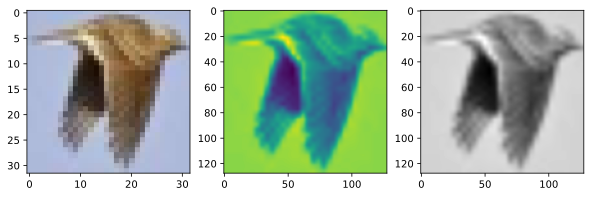

In [65]:
# applying transform

# option 1 - applying transform externally to img
img1 = Ts(cdata.data[123,:,:,:])

# option 2 - Using embedded transform
img2 = cdata.transform(cdata.data[123,:,:,:])

# let's see what we've done!
fig,ax = plt.subplots(1,3,figsize=(10,3))
ax[0].imshow(cdata.data[123,:,:,:])
ax[1].imshow(torch.squeeze(img1))
ax[2].imshow(torch.squeeze(img2),cmap='gray')

plt.show()

# Creating and using Custom DataLoaders

__Followed Norm - Numpy array -> pytorch tensor -> Dataset Obj -> DataLoader__

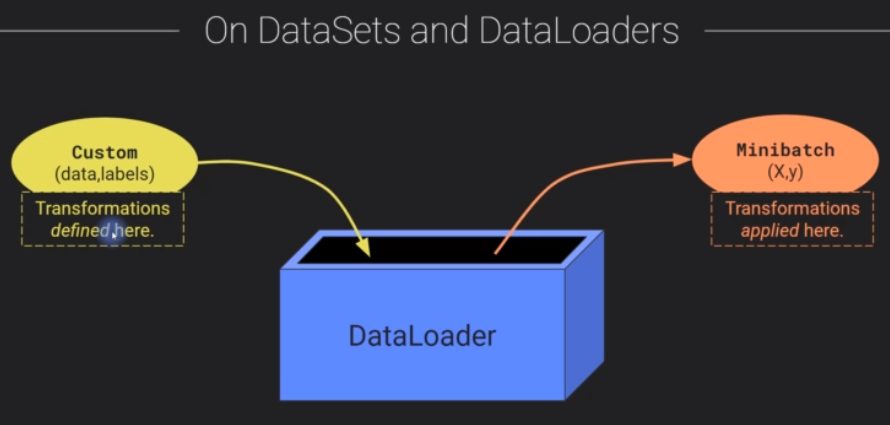

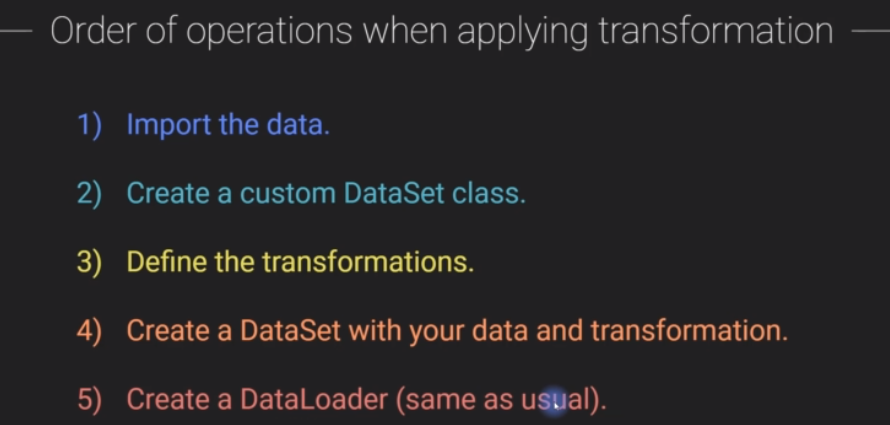

In [68]:
# FYI, review paper on data augmentation in DL:
# https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0197-0

In [67]:
import numpy as np
import torch

import torchvision
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
from IPython import display
display.set_matplotlib_formats('svg')

In [71]:
# importing data

# import dataset (comes with colab!)
data = np.loadtxt(open('../data/mnist_train_small.csv','rb'),delimiter=',')

# extract only the first 8
labels = data[:8,0]
data   = data[:8,1:]

# normalize the data to a range of [0 1]
dataNorm = data / np.max(data)

# reshaping data to 2D
dataNorm = dataNorm.reshape(dataNorm.shape[0], 1, 28, 28)
# above format - (no. of img, no. of channels, height. width)

print(dataNorm.shape)
print(labels.shape)

# convert to torch tensor format
dataT   = torch.tensor( dataNorm ).float()
labelsT = torch.tensor( labels ).long()

(8, 1, 28, 28)
(8,)


TensorDataset object, when initializes, checks if all data points have their corresponding labels (if present), gives error if size mismatch.

We override \_\_getitem__() and \__len__() functions from that instance

In [73]:
class customDataset(Dataset):
    def __init__(self, tensors, transform=None):
        # check if data and labels size match
        assert all(tensors[0].size(0) == t.size(0) for t in tensors), "Size mismatch between tensors"
        
        # assigning inputs
        self.tensors = tensors
        self.transform = transform
        
    def __getitem__(self, index): # performing relevant operations to retrieve items from dataset
        
        if self.transform: # if transform exists, return transformed version
            x = self.transform(self.tensors[0][index])
        else:
            x = self.tensors[0][index]
            
        y = self.tensors[1][index] # label
        
        return x,y
    
    def __len__(self):
        return self.tensors[0].size(0)

In [74]:
# many transforms apply only to PIl data, hence it is common to convert to PIL

imgTran = T.Compose([
    T.ToPILImage(),
    T.RandomVerticalFlip(p=.5), # probability of image being flipped is 0.5
    #T.RandomRotation(90),
    T.ToTensor()
])

In [75]:
# convert data into Data Loaders

train_data = customDataset((dataT, labelsT), imgTran)
trainLoader = DataLoader(train_data, batch_size=8, shuffle=False)

In [76]:
type(train_data)

__main__.customDataset

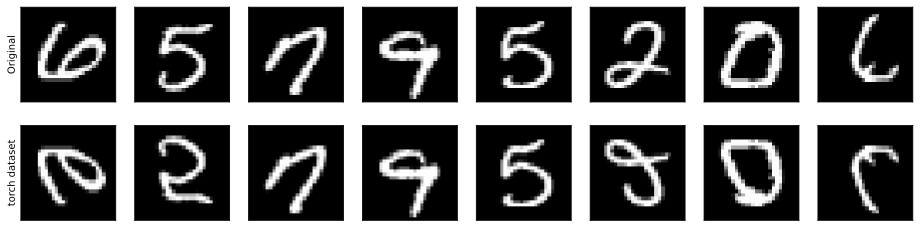

In [78]:
# importing from dataloader

X, y = next(iter(trainLoader))

# create a figure
fig,axs = plt.subplots(2,8,figsize=(16,4))


# loop over images in the dataset
for i in range(8):

    # draw images
    axs[0,i].imshow(dataT[i,0,:,:].detach(),cmap='gray')
    axs[1,i].imshow(X[i,0,:,:].detach(),cmap='gray')

    # some niceties
    for row in range(2):
        axs[row,i].set_xticks([])
        axs[row,i].set_yticks([])

# row labels
axs[0,0].set_ylabel('Original')
axs[1,0].set_ylabel('torch dataset')

plt.show()

In [79]:
len(train_data) # no increase in data size

8